In [45]:
from fds.quant.universe import UnivLimit, ScreeningExpressionUniverse
from fds.quant.dates import TimeSeries
from fds.quant.screening import Screen
import pandas as pd
import plotly.express as xp
import seaborn as sb
import matplotlib.pyplot as plt
import numpy as np





## S&P 500 Analysis

In [46]:
univ = ScreeningExpressionUniverse(UnivLimit.SP500)
univ.calculate()

FG_CONSTITUENTS(SP50, 0, Close): 0it [00:00, ?it/s]

Generating DataFrame: 0it [00:00, ?it/s]

In [47]:
univ.constituents.head()

,company_name,ticker,2023-03-31 00:00:00
symbol,,,
17290810,Cintas Corporation,CTAS-US,True
59156R10,"MetLife, Inc.",MET-US,True
69350610,"PPG Industries, Inc.",PPG-US,True
70432610,"Paychex, Inc.",PAYX-US,True
11563720,Brown-Forman Corporation Class B,BF.B-US,True


In [59]:
formulas = ['P_BETA_PR(3Y)','FF_PRICE_CLOSE_CP(MON,0)','FF_EPS(MON,0 L3M)','TVL_INSIGHT(0,ALLCATEGORIES)','FSI_SHS_OUT("SPLIT")','P_PRICE_RETURNS(2,0/0/-1,0)','FF_FCF_YLD(ANN_R_FCF,0)','FF_GROSS_MGN(QTR_R,0)']
columns = ['Beta','Price','EPS','ESG Score','Short Interest','Return 1Y','FCF Yield','Gross Margin']


In [60]:
screen = Screen(universe=univ, 
                formulas=formulas,
                columns=columns)

In [61]:
screen.calculate()

Screen: 0it [00:00, ?it/s]

Generating DataFrame: 0it [00:00, ?it/s]

#### First 5 SP50 Constituents 

In [62]:
df = screen.data
df.head(5)

ison_univ         company_name   ticker      Beta  \
date       symbol                                                        
2023-03-31 00105510       True   Aflac Incorporated   AFL-US  0.863915   
           00130H10       True      AES Corporation   AES-US  0.792137   
           00206R10       True            AT&T Inc.     T-US  0.473558   
           00282410       True  Abbott Laboratories   ABT-US  0.743387   
           00287Y10       True         AbbVie, Inc.  ABBV-US  0.609926   

                      Price     EPS  ESG Score  Short Interest  Return 1Y  \
date       symbol                                                           
2023-03-31 00105510   64.52  6.5882  51.556342        1.369150    2.75567   
           00130H10   24.08 -0.8174  76.615309        1.669120   -3.88772   
           00206R10   19.25 -1.2178  47.578508        1.162020   14.52920   
           00282410  101.26  3.9144  38.104896        0.725106  -12.93640   
           00287Y10  159.37  6.6266  35.132032        0.919951    2.08206   

                     FCF Yield  Gross Margin  
date       symbol                             
2023-03-31 00105510    8.45597           NaN  
           00130H10   -9.55669     18.137255  
           00206R10    9.39693     42.041285  
           00282410    4.02954     49.261718  
           00287Y10    8.43871     72.892004

In [63]:
df.dropna(inplace=True)
df.drop('ison_univ', axis=1,inplace=True)

#### What is the relationship between ESG Score and 1 Year Return?

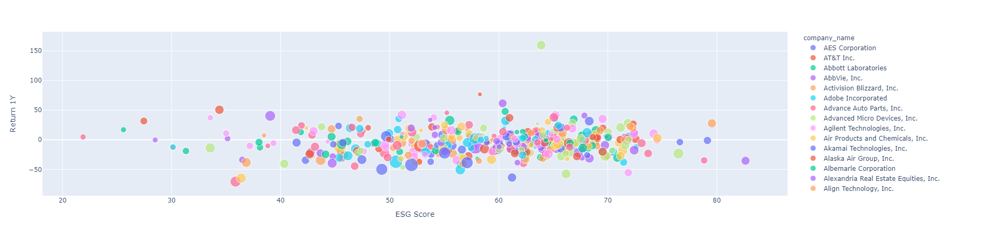

In [64]:
figure = xp.scatter(df,x=df['ESG Score'],y=df['Return 1Y'], color=df['company_name'], hover_name = df['ticker'],size=df['Beta'])
figure.show()

#### Correlation of data points of the SP50

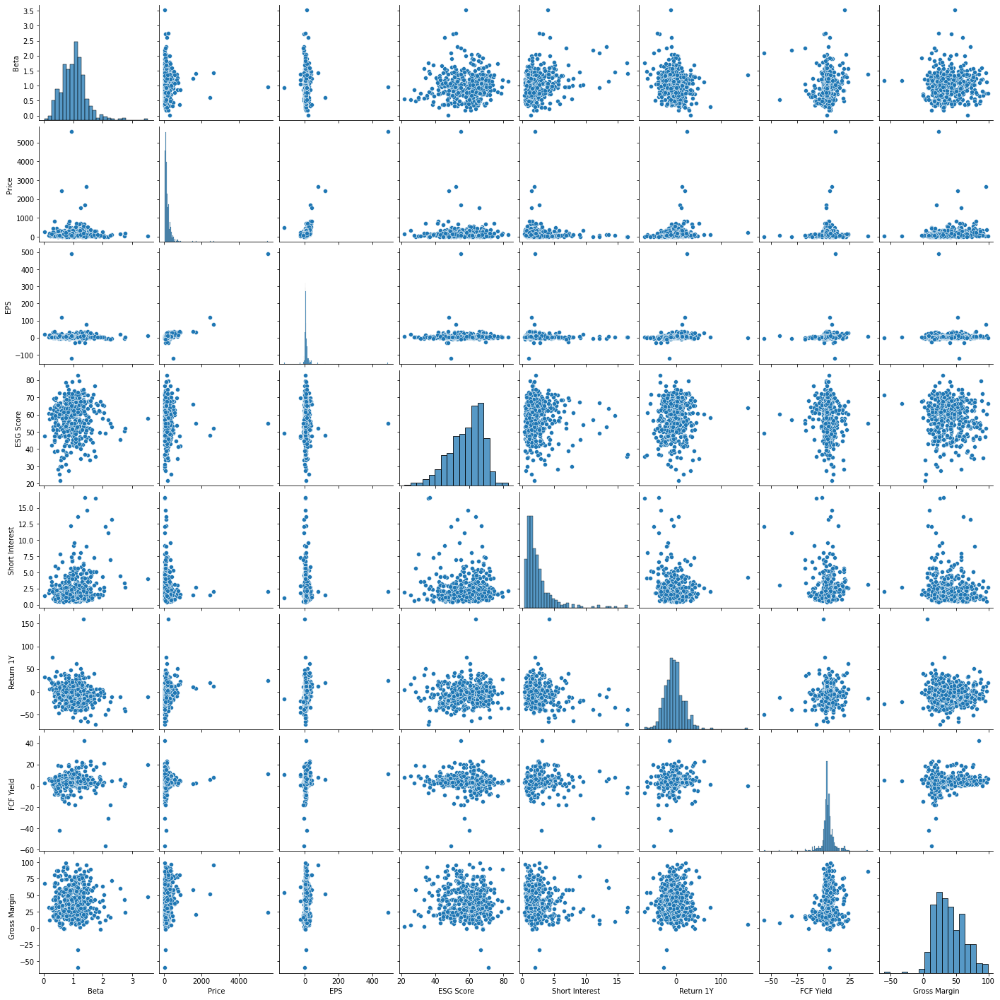

In [65]:
sb.pairplot(df,palette='Blues')

In [66]:
df_corr = df.corr()
df_corr

,Beta,Price,EPS,ESG Score,Short Interest,Return 1Y,FCF Yield,Gross Margin
Beta,1.000000,0.021223,-0.002580,0.068200,0.282017,-0.172088,0.072426,0.049399
Price,0.021223,1.000000,0.847140,-0.058807,-0.084566,0.179520,0.042895,0.134534
EPS,-0.002580,0.847140,1.000000,-0.019041,-0.038834,0.152980,0.106163,0.004465
ESG Score,0.068200,-0.058807,-0.019041,1.000000,-0.062947,0.058928,-0.084930,-0.062904
Short Interest,0.282017,-0.084566,-0.038834,-0.062947,1.000000,-0.198777,-0.123942,-0.116725
Return 1Y,-0.172088,0.179520,0.152980,0.058928,-0.198777,1.000000,0.101463,0.016827
FCF Yield,0.072426,0.042895,0.106163,-0.084930,-0.123942,0.101463,1.000000,0.145880
Gross Margin,0.049399,0.134534,0.004465,-0.062904,-0.116725,0.016827,0.145880,1.000000


#### Heatmap Visualization of the values

<AxesSubplot:>

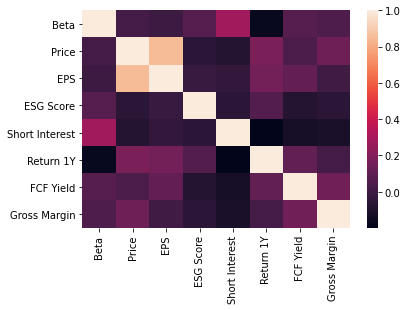

In [12]:
sb.heatmap(df_corr)

Time Series screening univ


In [67]:
time_series = TimeSeries(start='-2AM', freq='D')
univ = ScreeningExpressionUniverse(UnivLimit.SP500, time_series=time_series)
univ.calculate()


FG_CONSTITUENTS(SP50, 0, Close): 0it [00:00, ?it/s]

Generating DataFrame: 0it [00:00, ?it/s]

In [70]:
univ.constituents.head()

,company_name,ticker,2023-02-10 00:00:00,2023-02-13 00:00:00,2023-02-14 00:00:00,2023-02-15 00:00:00,2023-02-16 00:00:00,2023-02-17 00:00:00,2023-02-20 00:00:00,2023-02-21 00:00:00,...,2023-03-30 00:00:00,2023-03-31 00:00:00,2023-04-03 00:00:00,2023-04-04 00:00:00,2023-04-05 00:00:00,2023-04-06 00:00:00,2023-04-07 00:00:00,2023-04-10 00:00:00,2023-04-11 00:00:00,2023-04-12 00:00:00
symbol,,,,,,,,,,,,,,,,,,,,,
93442310,"Warner Bros. Discovery, Inc. Series A",WBD-US,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
14365830,Carnival Corporation,CCL-US,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
26000310,Dover Corporation,DOV-US,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
23333110,DTE Energy Company,DTE-US,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
98849810,"Yum! Brands, Inc.",YUM-US,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True


In [15]:
univ

FG_CONSTITUENTS(SP50, 0, Close)
Time Series:
------------
start: -2AM,
stop: 0D,
frequency: D,
calendar: FIVEDAY,
# dates: 44
Universe Details:
-----------------
Univ Type: EQUITY
# Identifiers: 506
Expression: FG_CONSTITUENTS(SP50, 0, Close)
Inactive Securities: True
Secondary Listings: True
Non-equity Securities: True
Wall Time: 25.20

#### SP50 Price and Sector 

In [16]:
screen = Screen(universe=univ, 
                formulas=['P_PRICE(0)', 'FR_RBICS_NAME_CURR(SECT)'],
                columns=['price', 'Sector'])

screen.calculate()



Screen: 0it [00:00, ?it/s]

Generating DataFrame: 0it [00:00, ?it/s]

In [71]:
screen.data.head()

company_name   ticker      Beta   Price  \
date       symbol                                                           
2023-03-31 00130H10            AES Corporation   AES-US  0.792137   24.08   
           00206R10                  AT&T Inc.     T-US  0.473558   19.25   
           00282410        Abbott Laboratories   ABT-US  0.743387  101.26   
           00287Y10               AbbVie, Inc.  ABBV-US  0.609926  159.37   
           00507V10  Activision Blizzard, Inc.  ATVI-US  0.371834   85.59   

                        EPS  ESG Score  Short Interest  Return 1Y  FCF Yield  \
date       symbol                                                              
2023-03-31 00130H10 -0.8174  76.615309        1.669120   -3.88772   -9.55669   
           00206R10 -1.2178  47.578508        1.162020   14.52920    9.39693   
           00282410  3.9144  38.104896        0.725106  -12.93640    4.02954   
           00287Y10  6.6266  35.132032        0.919951    2.08206    8.43871   
           00507V10  1.9176  38.479572        2.317390    7.47542    3.52495   

                     Gross Margin  
date       symbol                  
2023-03-31 00130H10     18.137255  
           00206R10     42.041285  
           00282410     49.261718  
           00287Y10     72.892004  
           00507V10     67.609254

In [18]:
df=screen.data


In [19]:
df.reset_index(inplace=True)
df.set_index('date')


,symbol,ison_univ,company_name,ticker,price,Sector
date,,,,,,
2023-02-10,00105510,True,Aflac Incorporated,AFL-US,69.88,Insurance
2023-02-10,00130H10,True,AES Corporation,AES-US,26.11,Utilities
2023-02-10,00206R10,True,AT&T Inc.,T-US,19.07,Telecommunications
2023-02-10,00282410,True,Abbott Laboratories,ABT-US,108.16,Healthcare Equipment
2023-02-10,00287Y10,True,"AbbVie, Inc.",ABBV-US,152.05,Biopharmaceuticals
...,...,...,...,...,...,...
2023-04-12,H2906T10,True,Garmin Ltd.,GRMN-US,98.28,Hardware
2023-04-12,H8498910,True,TE Connectivity Ltd.,TEL-US,125.38,Electronic Components and Manufacturing
2023-04-12,N5374510,True,LyondellBasell Industries NV,LYB-US,97.21,"Chemical, Plastic and Rubber Materials"


In [20]:
df2 = df.pivot(index ='date', columns ='ticker',values='price')
df2.head()

ticker,A-US,AAL-US,AAP-US,AAPL-US,ABBV-US,ABC-US,ABT-US,ACGL-US,ACN-US,ADBE-US,...,WYNN-US,XEL-US,XOM-US,XRAY-US,XYL-US,YUM-US,ZBH-US,ZBRA-US,ZION-US,ZTS-US
date,,,,,,,,,,,,,,,,,,,,,
2023-02-10,152.55,16.28,151.80,151.01,152.05,159.03,108.16,64.22,283.96,370.99,...,108.64,68.48,119.17,35.89,106.17,131.31,127.91,313.46,52.51,158.33
2023-02-13,154.60,16.51,152.19,153.85,153.73,158.61,108.52,65.25,288.35,375.00,...,109.28,68.71,117.80,36.89,107.15,132.52,128.05,318.95,52.90,163.14
2023-02-14,153.04,16.79,150.76,153.20,152.59,157.36,107.26,66.28,284.77,377.90,...,109.08,67.98,116.42,36.99,107.34,130.83,126.71,318.76,52.73,171.90
2023-02-15,151.75,16.80,151.29,155.33,151.06,158.81,107.28,67.98,287.65,375.94,...,108.46,67.90,116.07,36.59,107.88,131.67,126.51,327.02,52.18,175.02
2023-02-16,148.28,16.39,150.19,153.71,149.53,160.47,106.08,67.10,281.22,365.16,...,108.47,67.26,115.73,35.80,106.25,131.72,125.11,333.44,51.39,173.93


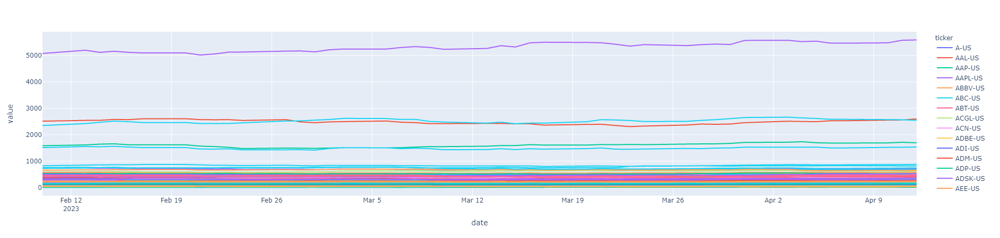

In [21]:

fig = xp.line(df2,x=df2.index,y=df2.columns)
fig.show()

In [22]:
df3 = df2.apply(lambda x: x.div(x.iloc[0]).subtract(1).mul(100))
df3.head()

ticker,A-US,AAL-US,AAP-US,AAPL-US,ABBV-US,ABC-US,ABT-US,ACGL-US,ACN-US,ADBE-US,...,WYNN-US,XEL-US,XOM-US,XRAY-US,XYL-US,YUM-US,ZBH-US,ZBRA-US,ZION-US,ZTS-US
date,,,,,,,,,,,,,,,,,,,,,
2023-02-10,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2023-02-13,1.343822,1.412776,0.256917,1.880670,1.104900,-0.264101,0.332840,1.603862,1.545992,1.080892,...,0.589102,0.335864,-1.149618,2.786291,0.923048,0.921484,0.109452,1.751420,0.742716,3.037959
2023-02-14,0.321206,3.132678,-0.685112,1.450235,0.355146,-1.050116,-0.832101,3.207723,0.285251,1.862584,...,0.405007,-0.730140,-2.307628,3.064921,1.102006,-0.365547,-0.938160,1.690806,0.418968,8.570707
2023-02-15,-0.524418,3.194103,-0.335968,2.860738,-0.651102,-0.138339,-0.813609,5.854874,1.299479,1.334268,...,-0.165685,-0.846963,-2.601326,1.950404,1.610624,0.274160,-1.094520,4.325911,-0.628452,10.541275
2023-02-16,-2.799082,0.675676,-1.060606,1.787961,-1.657350,0.905490,-1.923077,4.484584,-0.964925,-1.571471,...,-0.156480,-1.781542,-2.886633,-0.250766,0.075351,0.312238,-2.189039,6.374019,-2.132927,9.852839


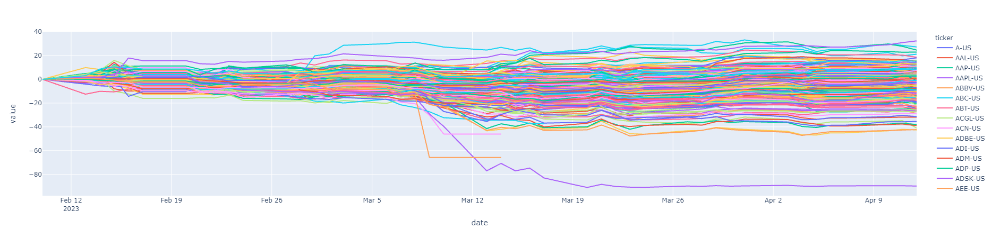

In [23]:
fig = xp.line(df3,x=df3.index,y=df3.columns)
fig.show()

In [24]:
dfg=df.groupby('Sector')
dfg.get_group('Banking')
dfgb = dfg.get_group('Banking').pivot(index ='date', columns ='ticker',values='price')
dfg.head()

,date,symbol,ison_univ,company_name,ticker,price,Sector
0,2023-02-10,00105510,True,Aflac Incorporated,AFL-US,69.88,Insurance
1,2023-02-10,00130H10,True,AES Corporation,AES-US,26.11,Utilities
2,2023-02-10,00206R10,True,AT&T Inc.,T-US,19.07,Telecommunications
3,2023-02-10,00282410,True,Abbott Laboratories,ABT-US,108.16,Healthcare Equipment
4,2023-02-10,00287Y10,True,"AbbVie, Inc.",ABBV-US,152.05,Biopharmaceuticals
...,...,...,...,...,...,...,...
490,2023-02-10,G6095L10,True,Aptiv PLC,APTV-US,112.80,Consumer Vehicles and Parts
561,2023-02-13,08651610,True,"Best Buy Co., Inc.",BBY-US,87.26,Consumer Retail
604,2023-02-13,16676410,True,Chevron Corporation,CVX-US,171.01,Integrated Oil and Gas Exploration and Production
678,2023-02-13,30231G10,True,Exxon Mobil Corporation,XOM-US,117.80,Integrated Oil and Gas Exploration and Production


In [25]:

df4 = dfgb.apply(lambda x: x.div(x.iloc[0]).subtract(1).mul(100))
df4.head()


ticker,CFG-US,CMA-US,FITB-US,FRC-US,HBAN-US,JPM-US,KEY-US,MTB-US,PNC-US,RF-US,SBNY-US,SIVBQ-US,TFC-US,USB-US,WFC-US,ZION-US
date,,,,,,,,,,,,,,,,
2023-02-10,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2023-02-13,0.811688,1.212040,0.753296,0.930233,0.984898,1.084799,1.080247,1.452647,1.029246,0.971694,0.569537,0.493501,1.488218,0.800821,1.304988,0.742716
2023-02-14,0.556586,1.012254,0.053807,-0.066445,0.787919,1.531480,-0.823045,1.006163,1.123384,0.760456,0.169322,0.238687,0.909467,0.882957,2.083772,0.418968
2023-02-15,0.718924,0.532765,-0.188324,-1.262458,1.181878,1.956892,-0.925926,0.773488,0.414209,0.971694,3.732779,2.167532,1.074824,0.780287,0.968217,-0.628452
2023-02-16,-0.718924,-1.358551,-1.372074,-3.492063,0.722259,0.553035,-1.851852,0.415042,-0.652692,-0.042248,-2.239668,-2.612650,-0.868127,-0.308008,-0.610398,-2.132927


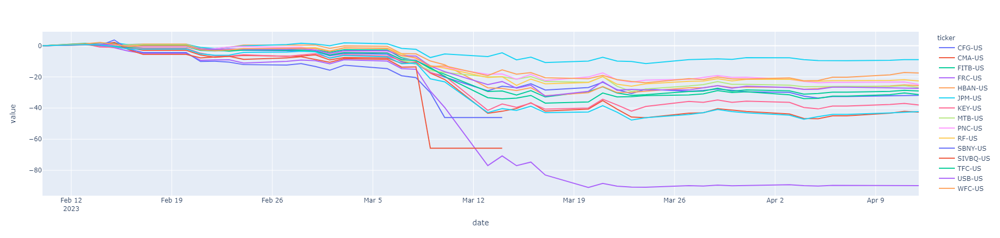

In [26]:
fig = xp.line(df4,x=df4.index,y=df4.columns)
fig.show()

In [27]:
df

,date,symbol,ison_univ,company_name,ticker,price,Sector
0,2023-02-10,00105510,True,Aflac Incorporated,AFL-US,69.88,Insurance
1,2023-02-10,00130H10,True,AES Corporation,AES-US,26.11,Utilities
2,2023-02-10,00206R10,True,AT&T Inc.,T-US,19.07,Telecommunications
3,2023-02-10,00282410,True,Abbott Laboratories,ABT-US,108.16,Healthcare Equipment
4,2023-02-10,00287Y10,True,"AbbVie, Inc.",ABBV-US,152.05,Biopharmaceuticals
...,...,...,...,...,...,...,...
22127,2023-04-12,H2906T10,True,Garmin Ltd.,GRMN-US,98.28,Hardware
22128,2023-04-12,H8498910,True,TE Connectivity Ltd.,TEL-US,125.38,Electronic Components and Manufacturing
22129,2023-04-12,N5374510,True,LyondellBasell Industries NV,LYB-US,97.21,"Chemical, Plastic and Rubber Materials"
22130,2023-04-12,N6596X10,True,NXP Semiconductors NV,NXPI-US,170.22,Electronic Components and Manufacturing


In [28]:
df_re = df.reset_index()
df_re.set_index(['ticker','date'],inplace=True)
df_re.head()

,,index,symbol,ison_univ,company_name,price,Sector
ticker,date,,,,,,
AFL-US,2023-02-10,0,00105510,True,Aflac Incorporated,69.88,Insurance
AES-US,2023-02-10,1,00130H10,True,AES Corporation,26.11,Utilities
T-US,2023-02-10,2,00206R10,True,AT&T Inc.,19.07,Telecommunications
ABT-US,2023-02-10,3,00282410,True,Abbott Laboratories,108.16,Healthcare Equipment
ABBV-US,2023-02-10,4,00287Y10,True,"AbbVie, Inc.",152.05,Biopharmaceuticals


In [29]:
df_re.sort_index(inplace=True)
df_re.head()

index    symbol  ison_univ                company_name  \
ticker date                                                                 
A-US   2023-02-10      9  00846U10       True  Agilent Technologies, Inc.   
       2023-02-13    512  00846U10       True  Agilent Technologies, Inc.   
       2023-02-14   1015  00846U10       True  Agilent Technologies, Inc.   
       2023-02-15   1518  00846U10       True  Agilent Technologies, Inc.   
       2023-02-16   2021  00846U10       True  Agilent Technologies, Inc.   

                    price               Sector  
ticker date                                     
A-US   2023-02-10  152.55  Healthcare Services  
       2023-02-13  154.60  Healthcare Services  
       2023-02-14  153.04  Healthcare Services  
       2023-02-15  151.75  Healthcare Services  
       2023-02-16  148.28  Healthcare Services

In [30]:
df_re['return'] = df_re.groupby(level='ticker')['price'].apply(lambda x: x.div(x.iloc[0]).subtract(1).mul(100))
df_re

index    symbol  ison_univ                company_name  \
ticker date                                                                 
A-US   2023-02-10      9  00846U10       True  Agilent Technologies, Inc.   
       2023-02-13    512  00846U10       True  Agilent Technologies, Inc.   
       2023-02-14   1015  00846U10       True  Agilent Technologies, Inc.   
       2023-02-15   1518  00846U10       True  Agilent Technologies, Inc.   
       2023-02-16   2021  00846U10       True  Agilent Technologies, Inc.   
...                  ...       ...        ...                         ...   
ZTS-US 2023-04-06  20094  98978V10       True        Zoetis, Inc. Class A   
       2023-04-07  20597  98978V10       True        Zoetis, Inc. Class A   
       2023-04-10  21100  98978V10       True        Zoetis, Inc. Class A   
       2023-04-11  21603  98978V10       True        Zoetis, Inc. Class A   
       2023-04-12  22106  98978V10       True        Zoetis, Inc. Class A   

                    price               Sector    return  
ticker date                                               
A-US   2023-02-10  152.55  Healthcare Services  0.000000  
       2023-02-13  154.60  Healthcare Services  1.343822  
       2023-02-14  153.04  Healthcare Services  0.321206  
       2023-02-15  151.75  Healthcare Services -0.524418  
       2023-02-16  148.28  Healthcare Services -2.799082  
...                   ...                  ...       ...  
ZTS-US 2023-04-06  168.94  Healthcare Services  6.701194  
       2023-04-07  168.94  Healthcare Services  6.701194  
       2023-04-10  170.87  Healthcare Services  7.920167  
       2023-04-11  171.21  Healthcare Services  8.134908  
       2023-04-12  171.45  Healthcare Services  8.286490  

[22132 rows x 7 columns]

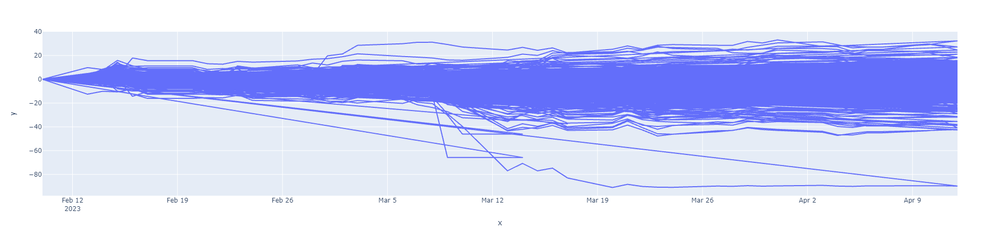

In [31]:
fig = xp.line(df_re.groupby(level='ticker'),x=df_re.index.get_level_values(1),y=df_re['return'],hover_name = df_re.index.get_level_values(0))
fig.show()

In [32]:
class Uni():
    def __init__(self,ID,starttime=None,endtime=None,freq=None,formulas='P_PRICE(0)',columns='price'):
        self.univ = ScreeningExpressionUniverse(getattr(UnivLimit,ID),time_series = TimeSeries(start=starttime,end=endtime, freq=freq))
        self.univ.calculate()
        self.constits = self.univ.constituents
        screen = Screen(universe=self.univ, formulas=formulas,columns=columns)
        screen.calculate()
        self.data = screen.data
        self.data.reset_index(inplace=True)
        self.data.set_index(['ticker','date'],inplace=True)
        self.data.sort_index(inplace=True)
    @property
    def calcReturns(self):
        self.data['returns'] = self.data.groupby(level='ticker')['price'].apply(lambda x: x.div(x.iloc[0]).subtract(1).mul(100))
        return self.data
    def group(self,group):
        self.data = self.data.groupby(group)
    def getGroup(self,group):
        return self.data.get_group(group)
    def graphGroup(self,group,column='returns'):
        fig = xp.line(df.getGroup(group).groupby(level='ticker'),x=df.getGroup(group).index.get_level_values(1),y=df.getGroup(group)['returns'],hover_name = df.getGroup(group).index.get_level_values(0),color =df.getGroup(group).index.get_level_values(0) )
        fig.show()
    
        
        

In [33]:
ID = 'SP500'
start='-1AM'
end='0'
frequency='D'
formulas=['P_PRICE(0)', 'FR_RBICS_NAME_CURR(SECT)']
columns = ['price', 'Sector']
df = Uni(ID,start,end,frequency,formulas,columns)


FG_CONSTITUENTS(SP50, 0, Close): 0it [00:00, ?it/s]

Generating DataFrame: 0it [00:00, ?it/s]

Screen: 0it [00:00, ?it/s]

Generating DataFrame: 0it [00:00, ?it/s]

In [34]:
df.calcReturns


symbol  ison_univ                company_name   price  \
ticker date                                                                  
A-US   2023-03-10  00846U10       True  Agilent Technologies, Inc.  135.72   
       2023-03-13  00846U10       True  Agilent Technologies, Inc.  136.69   
       2023-03-14  00846U10       True  Agilent Technologies, Inc.  138.40   
       2023-03-15  00846U10       True  Agilent Technologies, Inc.  134.03   
       2023-03-16  00846U10       True  Agilent Technologies, Inc.  136.82   
...                     ...        ...                         ...     ...   
ZTS-US 2023-04-06  98978V10       True        Zoetis, Inc. Class A  168.94   
       2023-04-07  98978V10       True        Zoetis, Inc. Class A  168.94   
       2023-04-10  98978V10       True        Zoetis, Inc. Class A  170.87   
       2023-04-11  98978V10       True        Zoetis, Inc. Class A  171.21   
       2023-04-12  98978V10       True        Zoetis, Inc. Class A  171.45   

                                Sector   returns  
ticker date                                       
A-US   2023-03-10  Healthcare Services  0.000000  
       2023-03-13  Healthcare Services  0.714707  
       2023-03-14  Healthcare Services  1.974654  
       2023-03-15  Healthcare Services -1.245211  
       2023-03-16  Healthcare Services  0.810492  
...                                ...       ...  
ZTS-US 2023-04-06  Healthcare Services  4.587383  
       2023-04-07  Healthcare Services  4.587383  
       2023-04-10  Healthcare Services  5.782208  
       2023-04-11  Healthcare Services  5.992695  
       2023-04-12  Healthcare Services  6.141274  

[12072 rows x 6 columns]

In [35]:
df.group('Sector')

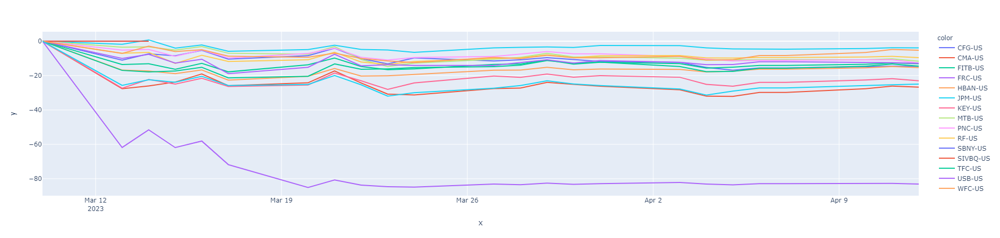

In [36]:
df.graphGroup('Banking')
